In [29]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
plt.style.use('ggplot')

In [30]:
df = pd.read_csv('data_mmda_traffic_spatial.csv')
df

,Date,Time,City,Location,Latitude,Longitude,High_Accuracy,Direction,Type,Lanes_Blocked,Involved,Tweet,Source
0,2018-08-20,7:55 AM,Pasig City,ORTIGAS EMERALD,14.586343,121.061481,1,EB,VEHICULAR ACCIDENT,1.0,TAXI AND MC,MMDA ALERT: Vehicular accident at Ortigas Emer...,https://twitter.com/mmda/status/10313302019705...
1,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,14.589432,121.057243,1,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,MMDA ALERT: Stalled L300 due to mechanical pro...,https://twitter.com/mmda/status/10313462477459...
2,2018-08-20,9:13 AM,Makati City,EDSA ROCKWELL,14.559818,121.040737,1,SB,VEHICULAR ACCIDENT,1.0,SUV AND L300,MMDA ALERT: Vehicular accident at EDSA Rockwel...,https://twitter.com/mmda/status/10313589669896...
3,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,14.589432,121.057243,1,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,MMDA ALERT: Stalled L300 due to mechanical pro...,https://twitter.com/mmda/status/10313590696535...
4,2018-08-20,10:27 AM,San Juan,ORTIGAS CLUB FILIPINO,14.601846,121.046754,1,EB,VEHICULAR ACCIDENT,1.0,2 CARS,MMDA ALERT: Vehicular accident at Ortigas Club...,https://twitter.com/mmda/status/10313711248424...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17307,2020-12-27,12:59 PM,Manila,QUIRINO GUAZON PETRON,14.585503,120.993783,1,SB,VEHICULAR ACCIDENT,1.0,MOTORCYCLE,MMDA ALERT: VEHICULAR ACCIDENT AT QUIRINO GUAZ...,https://twitter.com/mmda/status/13430604432589...
17308,2020-12-27,3:08 PM,Makati City,EDSA ESTRELLA,14.559818,121.040737,1,NB,STALLED VAN DUE TO TIRE PROBLEM,1.0,VAN,MMDA ALERT: STALLED VAN DUE TO TIRE PROBLEM AT...,https://twitter.com/mmda/status/13430967348098...
17309,2020-12-27,3:23 PM,Quezon City,EDSA P TUAZON FLYOVER,14.616404,121.052548,1,SB,VEHICULAR ACCIDENT,1.0,CAR AND MOTORCYCLE,MMDA ALERT: VEHICULAR ACCIDENT AT EDSA P. TUAZ...,https://twitter.com/mmda/status/13430968412152...
17310,2020-12-27,7:46 PM,Quezon City,ORTIGAS AVE EDSA POEA,14.593548,121.058028,1,WB,STALLED MULTICAB DUE TO MECHANICAL PROBLEM,1.0,MULTICAB,MMDA ALERT: STALLED MULTICAB DUE TO MECHANICAL...,https://twitter.com/mmda/status/13431795574073...


## Step 1: Data Understanding
1. Dataframe shape
2. head and tail
3. dtypes
4. describe

In [31]:
df.shape

(17312, 13)

In [32]:
df.head()

,Date,Time,City,Location,Latitude,Longitude,High_Accuracy,Direction,Type,Lanes_Blocked,Involved,Tweet,Source
0,2018-08-20,7:55 AM,Pasig City,ORTIGAS EMERALD,14.586343,121.061481,1,EB,VEHICULAR ACCIDENT,1.0,TAXI AND MC,MMDA ALERT: Vehicular accident at Ortigas Emer...,https://twitter.com/mmda/status/10313302019705...
1,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,14.589432,121.057243,1,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,MMDA ALERT: Stalled L300 due to mechanical pro...,https://twitter.com/mmda/status/10313462477459...
2,2018-08-20,9:13 AM,Makati City,EDSA ROCKWELL,14.559818,121.040737,1,SB,VEHICULAR ACCIDENT,1.0,SUV AND L300,MMDA ALERT: Vehicular accident at EDSA Rockwel...,https://twitter.com/mmda/status/10313589669896...
3,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,14.589432,121.057243,1,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,MMDA ALERT: Stalled L300 due to mechanical pro...,https://twitter.com/mmda/status/10313590696535...
4,2018-08-20,10:27 AM,San Juan,ORTIGAS CLUB FILIPINO,14.601846,121.046754,1,EB,VEHICULAR ACCIDENT,1.0,2 CARS,MMDA ALERT: Vehicular accident at Ortigas Club...,https://twitter.com/mmda/status/10313711248424...


In [33]:
df.columns

Index(['Date', 'Time', 'City', 'Location', 'Latitude', 'Longitude',
       'High_Accuracy', 'Direction', 'Type', 'Lanes_Blocked', 'Involved',
       'Tweet', 'Source'],
      dtype='object')

In [34]:
df.dtypes

Date              object
Time              object
City              object
Location          object
Latitude         float64
Longitude        float64
High_Accuracy      int64
Direction         object
Type              object
Lanes_Blocked    float64
Involved          object
Tweet             object
Source            object
dtype: object

## Step 2: Data Preparation
1. Dropping irrelevant columns and rows
2. Identifying duplicated columns
3. Renaming columns
4. Feature creation

In [35]:
df = df[['Date', 'Time', 'City', 'Location', 'Direction', 'Type', 'Lanes_Blocked', 'Involved', 'Latitude', 'Longitude']].copy()

In [36]:
df.shape

(17312, 10)

In [37]:
df['Date'] = pd.to_datetime(df['Date'])

In [38]:
df.isna().sum()

Date               0
Time             122
City             187
Location          23
Direction        857
Type              57
Lanes_Blocked    687
Involved         432
Latitude           0
Longitude          0
dtype: int64

In [39]:
df.loc[df.duplicated()]

,Date,Time,City,Location,Direction,Type,Lanes_Blocked,Involved,Latitude,Longitude
3,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,14.589432,121.057243
8,2018-08-20,12:39 PM,Mandaluyong,EDSA LIGHT MALL,NB,MULTIPLE COLLISION,2.0,3 CARS,14.574014,121.048410
16,2018-08-20,8:58 PM,Pasig City,C5 ORTIGAS FLYOVER,NB,STALLED CLOSED VAN DUE TO MECHANICAL DEFECT,1.0,CLOSED VAN,14.589706,121.079945
28,2018-08-21,6:30 AM,Quezon City,QUEZON AVENUE,WB,VEHICULAR ACCIDENT,1.0,BUS AND CAR,14.639754,121.030335
73,2018-08-23,8:32 AM,Quezon City,EDSA TRINOMA,NB,STALLED BUS DUE TO MECHANICAL PROBLEM,1.0,BUS,14.652928,121.031852
...,...,...,...,...,...,...,...,...,...,...
16828,2020-11-04,11:33 PM,Mandaluyong,EDSA RELIANCE,NB,VEHICULAR ACCIDENT,NaN,MC,14.576702,121.050365
16968,2020-11-18,7:07 PM,Mandaluyong,EDSA SHAW BLVD,NaN,VEHICULAR ACCIDENT,1.0,BICYCLE AND CAR,14.581153,121.053565
16969,2020-11-18,7:07 PM,Mandaluyong,EDSA SHAW BLVD,NaN,VEHICULAR ACCIDENT,1.0,BICYCLE AND CAR,14.581153,121.053565
16970,2020-11-18,7:07 PM,Mandaluyong,EDSA SHAW BLVD,NaN,VEHICULAR ACCIDENT,1.0,BICYCLE AND CAR,14.581153,121.053565


In [40]:
df_cleaned = df.drop_duplicates()

In [41]:
df

,Date,Time,City,Location,Direction,Type,Lanes_Blocked,Involved,Latitude,Longitude
0,2018-08-20,7:55 AM,Pasig City,ORTIGAS EMERALD,EB,VEHICULAR ACCIDENT,1.0,TAXI AND MC,14.586343,121.061481
1,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,14.589432,121.057243
2,2018-08-20,9:13 AM,Makati City,EDSA ROCKWELL,SB,VEHICULAR ACCIDENT,1.0,SUV AND L300,14.559818,121.040737
3,2018-08-20,8:42 AM,Mandaluyong,EDSA GUADIX,NB,STALLED L300 DUE TO MECHANICAL PROBLEM,1.0,L300,14.589432,121.057243
4,2018-08-20,10:27 AM,San Juan,ORTIGAS CLUB FILIPINO,EB,VEHICULAR ACCIDENT,1.0,2 CARS,14.601846,121.046754
...,...,...,...,...,...,...,...,...,...,...
17307,2020-12-27,12:59 PM,Manila,QUIRINO GUAZON PETRON,SB,VEHICULAR ACCIDENT,1.0,MOTORCYCLE,14.585503,120.993783
17308,2020-12-27,3:08 PM,Makati City,EDSA ESTRELLA,NB,STALLED VAN DUE TO TIRE PROBLEM,1.0,VAN,14.559818,121.040737
17309,2020-12-27,3:23 PM,Quezon City,EDSA P TUAZON FLYOVER,SB,VEHICULAR ACCIDENT,1.0,CAR AND MOTORCYCLE,14.616404,121.052548
17310,2020-12-27,7:46 PM,Quezon City,ORTIGAS AVE EDSA POEA,WB,STALLED MULTICAB DUE TO MECHANICAL PROBLEM,1.0,MULTICAB,14.593548,121.058028


In [42]:
print(f"Removed {len(df) - len(df_cleaned)} duplicate rows.")

Removed 232 duplicate rows.


## Step 3: Feature Understanding
(Univariate analysis)

Plotting Feature Distributions

1.1. Histogram

1.2. KDE

1.3. Boxplot

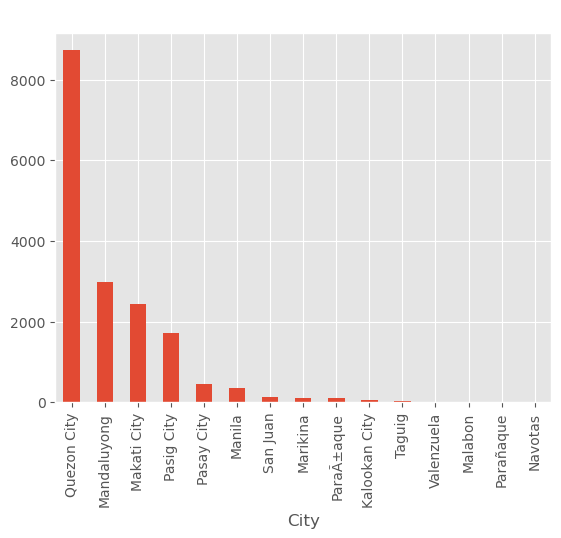

In [43]:
ax = df['City'].value_counts() \
    .plot(kind = 'bar', title = 'Top Cities with Most Accidents')

In [44]:
df["Latitude"] = pd.to_numeric(df["Latitude"], errors="coerce")
df["Longitude"] = pd.to_numeric(df["Longitude"], errors="coerce")
df = df.dropna(subset=["Latitude", "Longitude"])

In [45]:
# Find the center of the data for better visualization
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Create a MarkerCluster layer
marker_cluster = MarkerCluster().add_to(m)

# Add each point to the cluster
for index, row in df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"Incident at ({row['Latitude']}, {row['Longitude']})",
    ).add_to(marker_cluster)

# Save and show the map
m.save("clustered_map.html")
m

In [46]:
from collections import Counter

# Count the frequency of incidents per location
location_counts = Counter(zip(df["Latitude"], df["Longitude"]))

for (lat, lon), count in location_counts.items():
    folium.CircleMarker(
        location=[lat, lon],
        radius=5 + count * 0.5,  # Increase size based on count
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        popup=f"Incidents: {count}",
    ).add_to(m)

In [47]:
# Cell [19]
print(df["Type"].value_counts())

Type
VEHICULAR ACCIDENT                                                                                                                  11775
STALLED BUS DUE TO MECHANICAL PROBLEM                                                                                                 864
MULTIPLE COLLISION                                                                                                                    623
STALLED CAR DUE TO MECHANICAL PROBLEM                                                                                                 593
STALLED TRUCK DUE TO MECHANICAL PROBLEM                                                                                               395
                                                                                                                                    ...  
ONGOING MAYNILAD WATER LEAK REPAIR                                                                                                      1
STALLED 18 WHEELER TRUCK DUE 

In [48]:
# List all of the types of incidents
df["Type"].unique()

array(['VEHICULAR ACCIDENT', 'STALLED L300 DUE TO MECHANICAL PROBLEM',
       'VEHICULAR ON FIRE', 'MULTIPLE COLLISION',
       'STALLED TRUCK DUE TO MECHANICAL PROBLEM',
       'MULTIPLE COLLISION C5ENEO KAT',
       'STALLED BUS DUE TO MECHANICAL DEFECT',
       'STALLED CLOSED VAN DUE TO MECHANICAL DEFECT',
       'STALLED BUS DUE TO MECHANICAL PROBLEM',
       'ONGOING DPWH ROAD PATCHING', 'ONGOING DPWH FOOTBRIDGE PAINTING',
       'ONGOING DPWH ASPHALT LAYING',
       'STALLED VAN DUE TO MECHANICAL PROBLEM',
       'STALLED JEEP DUE TO MECHANICAL DEFECT',
       'STALLED TRUCK DUE TO MECHANICAL DEFECT',
       'STALLED TRUCK DUE TO MECHANICAL DEFECT KATIPUNAN',
       'VEHICULAR ACCIDENT COMMONWEALTH', 'VEHICULAR ACCIDENT KAT',
       'STALLED CAR DUE TO FLAT TIRE',
       'STALLED DUMP TRUCK DUE TO MECHANICAL PROBLEM',
       'STALLED CAR DUE TO MECHANICAL PROBLEM',
       'ONGOING ANTI SMOKE BELCHING OPERATION',
       'STALLED VAN DUE TO FLAT TIRE',
       'STALLED TAXI DUE TO 

In [49]:
df["Type"] = df["Type"].astype(str).str.lower()

def categorize_type(text):
    if isinstance(text, str):  
        if "stalled" in text:
            return "Stalled Vehicle"
        elif "accident" in text:
            return "Accident"
        elif "blocking" in text:
            return "Road Reblocking"
        elif "collision" in text:
            return "Collision"
        elif "repair" in text:
            return "Road Repair"
        elif "ongoing" in text:
            return "Operation or Event by another Agency"
        elif "hit" in text:
            return "Hit and Run"
    return "Other"

df["Category"] = df["Type"].apply(categorize_type)

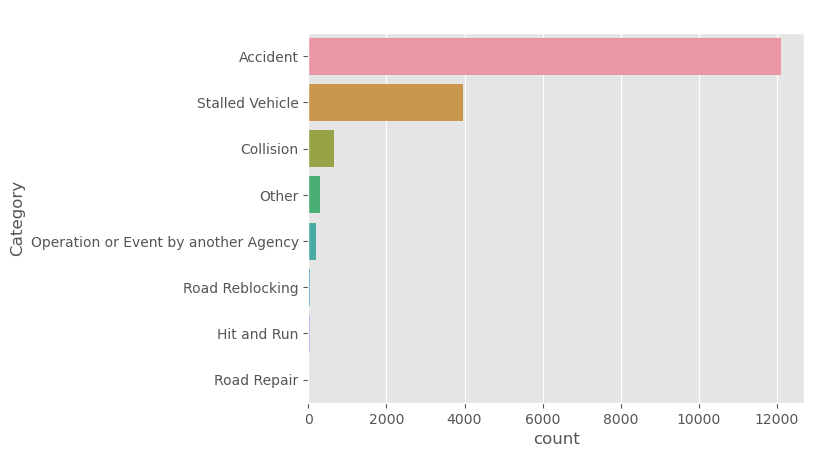

In [28]:
sns.countplot(y=df["Category"], order=df["Category"].value_counts().index)
plt.title("Category Distribution")
plt.show()